 
# <p style="text-align: center;">Devices Price Classification 💸💻📱</p>

# Problem & Data Definition




## 🔎 Problem Statement
For sellers, accurately pricing these devices based on their characteristics is crucial to remain competitive in the market. Mispricing can lead to reduced sales or diminished profit margins. Therefore, an efficient pricing strategy is essential.

The goal is to develop a classification system using AI that predicts the price range of mobile devices based on their specifications. This system will help sellers classify the prices of devices accurately, enabling them to make informed pricing decisions and optimize their sales strategy.

## 📊 Data Definition
The dataset contains detailed information about various mobile devices, including their technical specifications and price range. The columns in the dataset are as follows:


| Column         | Description                                                                                       |
|----------------|---------------------------------------------------------------------------------------------------|
| battery_power  | Total energy a battery can store in one time measured in mAh.                                      |
| blue           | Indicates whether the device has Bluetooth support (1 for Yes, 0 for No).                          |
| clock_speed    | The speed at which the microprocessor executes instructions, measured in GHz.                       |
| dual_sim       | Indicates whether the device supports dual SIM (1 for Yes, 0 for No).                               |
| fc             | Front Camera megapixels.                                                                           |
| four_g         | Indicates whether the device supports 4G (1 for Yes, 0 for No).                                     |
| int_memory     | Internal memory in gigabytes.                                                                      |
| m_dep          | Mobile depth in cm.                                                                                |
| mobile_wt      | Weight of the mobile device in grams.                                                               |
| n_cores        | Number of cores of the processor.                                                                  |
| pc             | Primary Camera megapixels.                                                                         |
| px_height      | Pixel resolution height.                                                                           |
| px_width       | Pixel resolution width.                                                                            |
| ram            | Random Access Memory in megabytes.                                                                 |
| sc_h           | Screen height of the mobile device in cm.                                                          |
| sc_w           | Screen width of the mobile device in cm.                                                           |
| talk_time      | Longest time that a single battery charge will last during continuous talk.                        |
| three_g        | Indicates whether the device supports 3G (1 for Yes, 0 for No).                                     |
| touch_screen   | Indicates whether the device has a touch screen (1 for Yes, 0 for No).                             |
| wifi           | Indicates whether the device supports WiFi (1 for Yes, 0 for No).                                   |
| price_range    | Target variable indicating the price range of the mobile device:                                   |
|                | - 0: Low cost                                                                                     |
|                | - 1: Medium cost                                                                                  |
|                | - 2: High cost                                                                                    |
|                | - 3: Very high cost                                                                               |


# Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_predict,cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import make_scorer,accuracy_score, precision_score,recall_score, f1_score
from sklearn.metrics import confusion_matrix ,classification_report
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings("ignore")

# Data Loading

In [2]:
train = pd.read_csv('/kaggle/input/devices-features/train - train.csv')
test = pd.read_csv('/kaggle/input/devices-features/test - test.csv')

In [3]:
pd.set_option('display.max_columns', None)
train.head(7)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1.0,0.0,7.0,0.6,188.0,2.0,2.0,20.0,756.0,2549.0,9.0,7.0,19,0,0,1,1
1,1021,1,0.5,1,0.0,1.0,53.0,0.7,136.0,3.0,6.0,905.0,1988.0,2631.0,17.0,3.0,7,1,1,0,2
2,563,1,0.5,1,2.0,1.0,41.0,0.9,145.0,5.0,6.0,1263.0,1716.0,2603.0,11.0,2.0,9,1,1,0,2
3,615,1,2.5,0,0.0,0.0,10.0,0.8,131.0,6.0,9.0,1216.0,1786.0,2769.0,16.0,8.0,11,1,0,0,2
4,1821,1,1.2,0,13.0,1.0,44.0,0.6,141.0,2.0,14.0,1208.0,1212.0,1411.0,8.0,2.0,15,1,1,0,1
5,1859,0,0.5,1,3.0,0.0,22.0,0.7,164.0,1.0,7.0,1004.0,1654.0,1067.0,17.0,1.0,10,1,0,0,1
6,1821,0,1.7,0,4.0,1.0,10.0,0.8,139.0,8.0,10.0,381.0,1018.0,3220.0,13.0,8.0,18,1,0,1,3


In [3]:
print(f'Trainset has {train.shape[0]} rows and {train.shape[1]} cols')
print(f'Testset has {test.shape[0]} rows and {test.shape[1]} cols')

Trainset has 2000 rows and 21 cols
Testset has 1000 rows and 21 cols


## Data Splitting 

In [3]:
X = train.drop('price_range', axis = 1)
y = train['price_range']

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y , stratify = y, test_size=0.15, random_state=42) 

# Data EDA & Preprocesing

In [17]:
#to view some basic statistical details of train data
X_train.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
count,1700.000000,1700.000000,1700.000000,1700.000000,1695.000000,1695.000000,1695.000000,1695.000000,1696.000000,1696.000000,1695.000000,1696.000000,1698.000000,1698.000000,1699.000000,1699.000000,1700.000000,1700.000000,1700.000000,1700.000000
mean,1239.548235,0.493529,1.526118,0.508235,4.318584,0.521534,32.077876,0.503776,140.221698,4.537736,9.879056,645.932783,1248.007656,2126.388104,12.266627,5.804591,10.920588,0.764118,0.502353,0.511765
std,438.146655,0.500105,0.815795,0.500079,4.331317,0.499683,18.189345,0.288991,35.273250,2.283400,6.059436,444.233412,430.007930,1082.910026,4.214802,4.399454,5.473801,0.424674,0.500142,0.500009
min,501.000000,0.000000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,0.000000,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000
25%,852.000000,0.000000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,5.000000,280.750000,874.000000,1205.250000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000
50%,1231.000000,0.000000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,10.000000,564.000000,1247.000000,2145.000000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000
75%,1615.000000,1.000000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,15.000000,954.000000,1620.500000,3056.750000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000
max,1998.000000,1.000000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,20.000000,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000


* The distribution suggests a wide range of battery capacities, with most devices having battery power between 852 mAh (25th percentile) and 1615 mAh (75th percentile).
* About 49.35% of the devices have Bluetooth (blue mean is 0.4935).
* A significant majority, around 76.41%, of the devices support 3G (three_g mean is 0.7641).
* Approximately 52.15% of the devices support 4G (four_g mean is 0.5215).
* Around 50.24% of the devices have WiFi capability (wifi mean is 0.5024).
* The presence of dual SIM is nearly evenly split, with 50.82% of devices having this feature (dual_sim mean is 0.5082).
* The average RAM is approximately 2126 MB (or around 2 GB), with a standard deviation of 1083 MB. RAM values range from 256 MB to 3998 MB, indicating that the dataset includes both low-end and high-end devices.

- We have the same number of phone for every price range, that's a good things to learn and train a dataset

In [44]:
X_train.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc               float64
four_g           float64
int_memory       float64
m_dep            float64
mobile_wt        float64
n_cores          float64
pc               float64
px_height        float64
px_width         float64
ram              float64
sc_h             float64
sc_w             float64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
dtype: object

In [20]:
y_train.unique()

array([0, 3, 2, 1])

As mentioned earlier, we have 4 categories 
* 0: Low cost
* 1: Medium cost
* 2: High cost
* 3: Very high cost

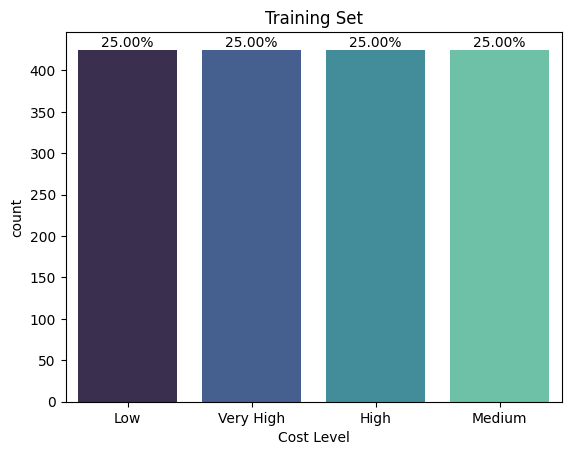

In [19]:
price_map = {0:'Low', 1:'Medium', 2:'High', 3:'Very High'}
ax = sns.countplot(x=y_train.map(price_map),palette='mako')
total = float(len(y_train))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width()/2.,
            height+0.002 * total ,
            '{:.2f}%'.format((height/total)*100),
            ha="center") 

plt.xlabel('Cost Level')
plt.title('Training Set')
plt.show()
# Balanced Dataset

**Checking for NULL values**

In [39]:
print(X_train.isna().sum().sort_values(ascending=False))

pc               5
fc               5
four_g           5
int_memory       5
m_dep            5
mobile_wt        4
n_cores          4
px_height        4
px_width         2
ram              2
sc_w             1
sc_h             1
touch_screen     0
three_g          0
talk_time        0
battery_power    0
blue             0
dual_sim         0
clock_speed      0
wifi             0
dtype: int64


There are few columns that have a small number of missing values,such as Primary Camera megapixels, Front Camera megapixels, and Internal memory ranging from 1 to 5.

**Checking for Duplicates**

In [42]:
print(X_train.duplicated().sum())

0


In [7]:
# vidualtion categorical and numerical columns.
categorical_variables=[col for col in X_train.columns if X_train[col].nunique()<10]
print('categorical:',categorical_variables)
numerical_variables=[col for col in X_train.columns if X_train[col].nunique()>=10]
print('numerical:' ,numerical_variables)

categorical: ['blue', 'dual_sim', 'four_g', 'n_cores', 'three_g', 'touch_screen', 'wifi']
numerical: ['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']


- There are 7 categorical columns and 13 continuous columns

### 1. Categorical features

In [236]:
for var in categorical_variables:
    print(f'{var} : {X_train[var].nunique()} categories')

blue : 2 categories
dual_sim : 2 categories
four_g : 2 categories
n_cores : 8 categories
three_g : 2 categories
touch_screen : 2 categories
wifi : 2 categories


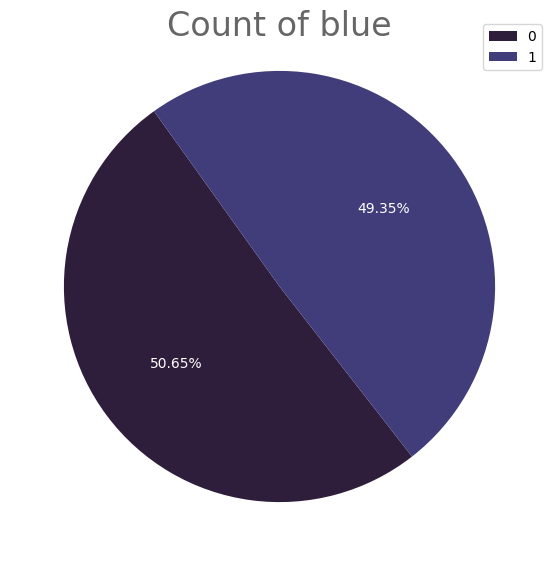

In [104]:
colors = sns.color_palette("mako")
sns.set_palette(colors)
size = X_train['blue'].value_counts()
lbl=X_train.blue.value_counts().index
plt.figure(figsize=(7,7)) 
plt.title('Count of blue',fontsize=24,y=.95,alpha=0.6)
plt.pie(size ,startangle=125.6,autopct='%1.2f%%',textprops={'color': 'white'})
plt.legend(labels=lbl);

- The number of devices that have bluetooth is almost equal to the number of devices that do not

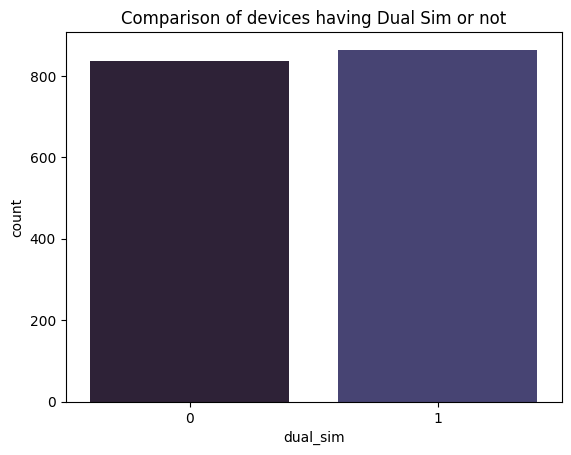

In [116]:
sns.countplot(x = X_train['dual_sim'])
plt.title('Comparison of devices having Dual Sim or not');

- The number of devices that have sim cards is almost equal to the number of devices that do not

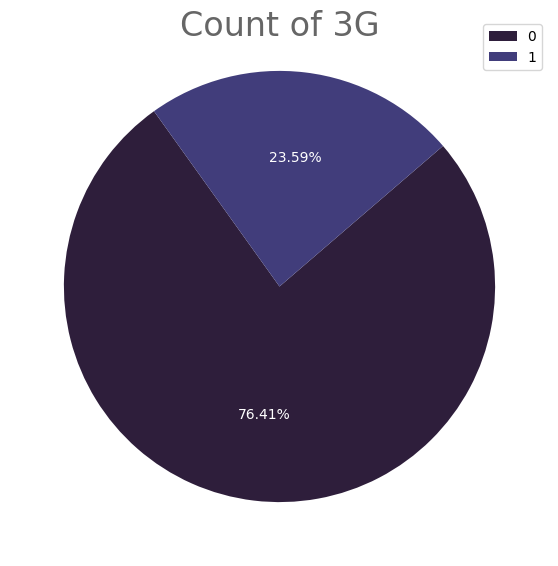

In [148]:
colors = sns.color_palette("mako")
sns.set_palette(colors)
size = X_train['three_g'].value_counts()
lbl=X_train.blue.value_counts().index
plt.figure(figsize=(7,7)) 
plt.title('Count of 3G',fontsize=24,y=.95,alpha=0.6)
plt.pie(size ,startangle=125.6,autopct='%1.2f%%',textprops={'color': 'white'})
plt.legend(labels=lbl);

- The number of mobiles phones that are 3G is almost triple that of mobiles that are not 3G

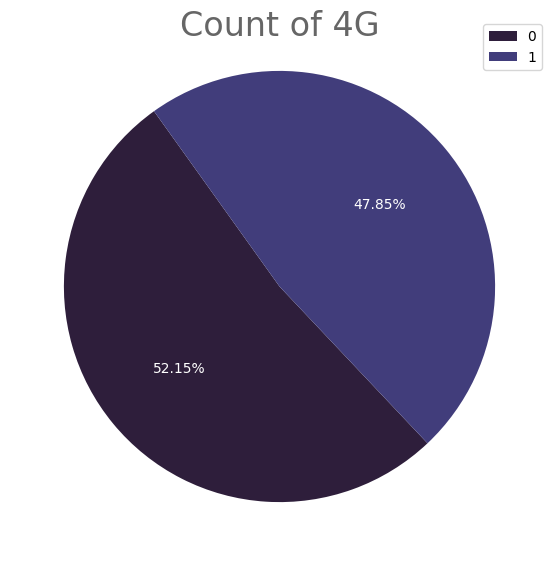

In [149]:
colors = sns.color_palette("mako")
sns.set_palette(colors)
size = X_train['four_g'].value_counts()
lbl=X_train.blue.value_counts().index
plt.figure(figsize=(7,7)) 
plt.title('Count of 4G',fontsize=24,y=.95,alpha=0.6)
plt.pie(size ,startangle=125.6,autopct='%1.2f%%',textprops={'color': 'white'})
plt.legend(labels=lbl);

- The number of mobiles phones that are 4G is close to the others that are not.

In [119]:
X_train['n_cores'].value_counts()

n_cores
4.0    232
7.0    222
8.0    216
3.0    208
5.0    207
2.0    206
1.0    203
6.0    202
Name: count, dtype: int64

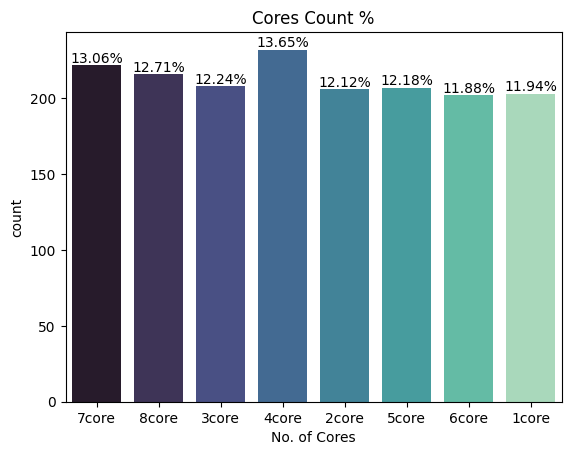

In [165]:
cores_map = {1:'1core',2:'2core',3:'3core',4:'4core',5:'5core',6:'6core',7:'7core',8:'8core'}
ax = sns.countplot(x=train_xy['n_cores'].map(cores_map),palette='mako')
total = float(len(train_xy))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width()/2.,
            height+0.001 * total ,
            '{:.2f}%'.format((height/total)*100),
            ha="center") 

plt.xlabel('No. of Cores')
plt.title('Cores Count %')
plt.show()

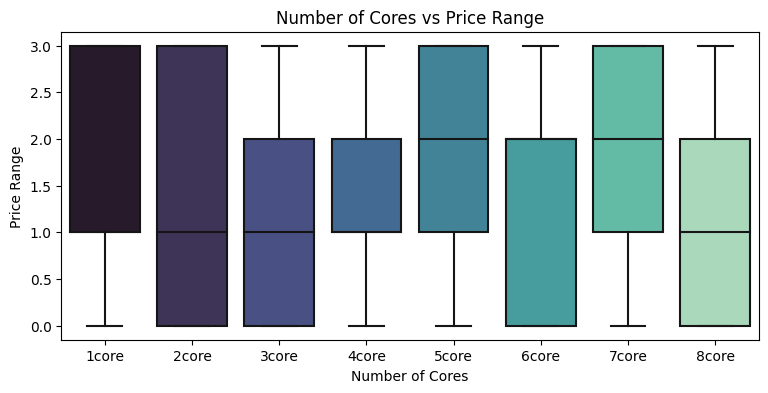

In [176]:
cores_map = {1: '1core', 2: '2core', 3: '3core', 4: '4core', 5: '5core', 6: '6core', 7: '7core', 8: '8core'}

# Map the 'n_cores' column using cores_map
train_xy['n_cores_mapped'] = train_xy['n_cores'].map(cores_map)

plt.figure(figsize=(9, 4))
sns.boxplot(x='n_cores_mapped', y='price_range', data=train_xy, order=list(cores_map.values()), palette='mako')

plt.title('Number of Cores vs Price Range')
plt.xlabel('Number of Cores')
plt.ylabel('Price Range')
plt.show()

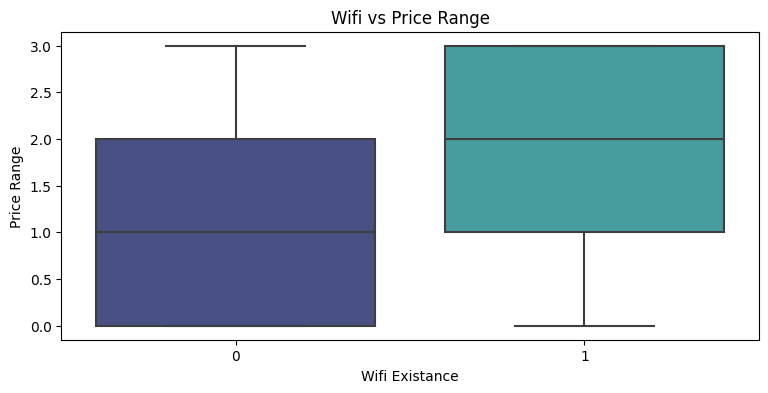

In [177]:
plt.figure(figsize=(9, 4))
sns.boxplot(x='wifi', y='price_range', data=train_xy, palette='mako')

plt.title('Wifi vs Price Range')
plt.xlabel('Wifi Existance')
plt.ylabel('Price Range')
plt.show()

- Existance of WIFI increases the price range significantly.

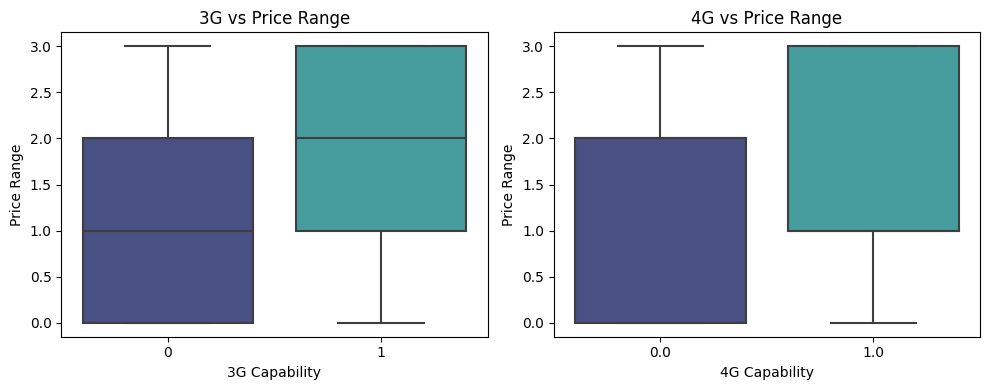

In [214]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# Boxplot for 3G vs. Price Range
sns.boxplot(x='three_g', y='price_range', data=train_xy, ax=axs[0], palette='mako')
axs[0].set_title('3G vs Price Range')
axs[0].set_xlabel('3G Capability')
axs[0].set_ylabel('Price Range')

# Boxplot for 4G vs. Price Range
sns.boxplot(x='four_g', y='price_range', data=train_xy, ax=axs[1], palette='mako')
axs[1].set_title('4G vs Price Range')
axs[1].set_xlabel('4G Capability')
axs[1].set_ylabel('Price Range')

plt.tight_layout()
plt.show()


In [191]:
train_xy.groupby('four_g').mean(numeric_only=True)['price_range']

four_g
0.0    1.483354
1.0    1.514706
Name: price_range, dtype: float64

In [192]:
train_xy.groupby('three_g').mean(numeric_only=True)['price_range']

three_g
0    1.461347
1    1.511932
Name: price_range, dtype: float64

<Figure size 400x400 with 0 Axes>

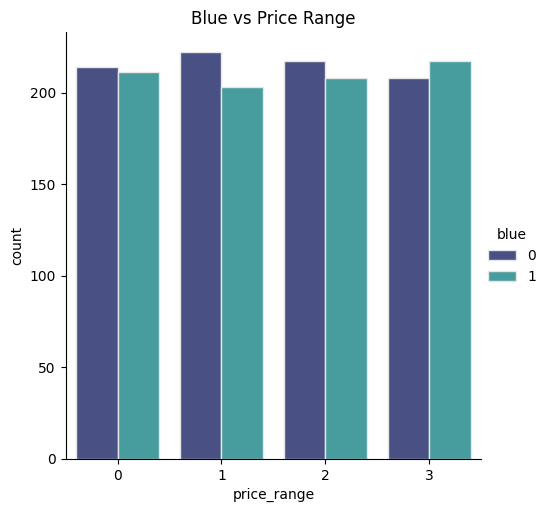

<Figure size 400x400 with 0 Axes>

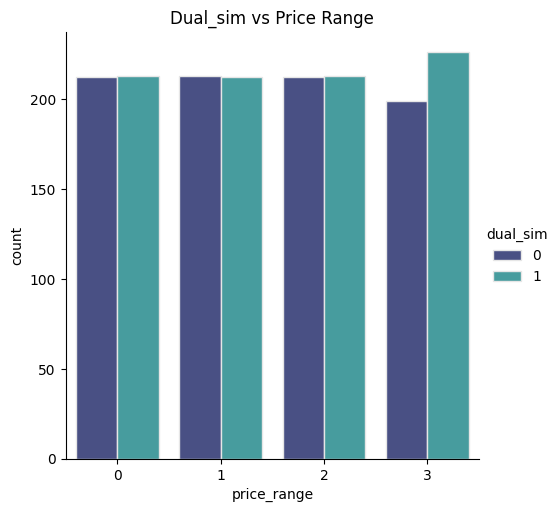

<Figure size 400x400 with 0 Axes>

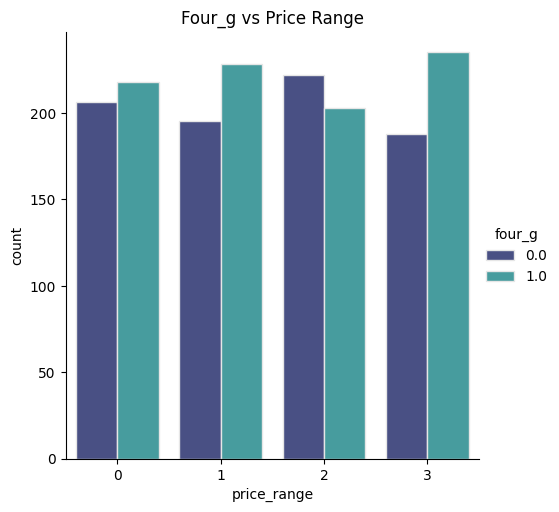

<Figure size 400x400 with 0 Axes>

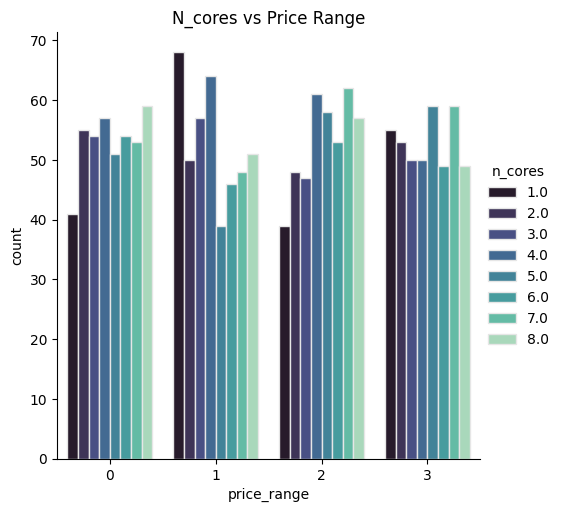

<Figure size 400x400 with 0 Axes>

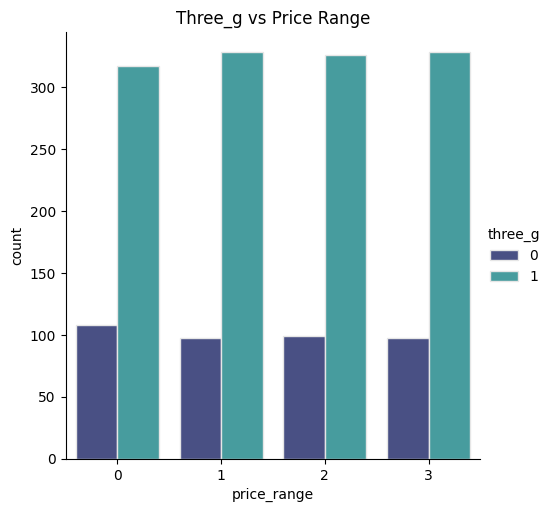

<Figure size 400x400 with 0 Axes>

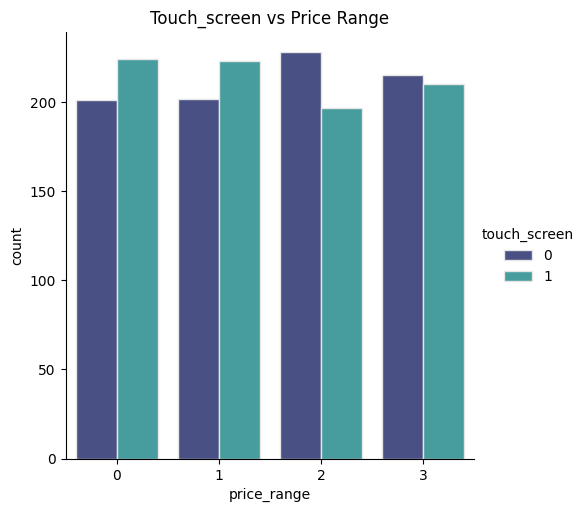

<Figure size 400x400 with 0 Axes>

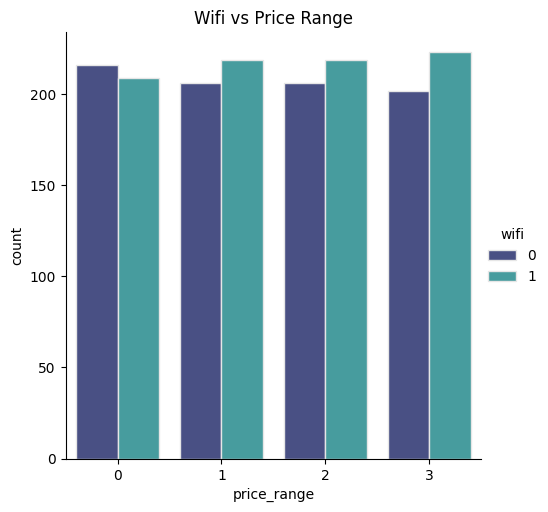

In [268]:
for i in range(0,7) :
    plt.figure(figsize=(4,4))
    sns.catplot(x="price_range", hue=categorical_variables[i], kind="count",palette="mako", edgecolor=".9",data=train_xy)
    plt.title(f'{categorical_variables[i].capitalize()} vs Price Range')
    plt.show();

Observations:
* Expensive mobile has bluetooth
* If mobile has dual_sim card holder then price will be increased
* Very expensive mobile provide 4 g facility
* Very expensive mobile provide 3 g facility

### 2. Numerical Features

In [234]:
numerical_variables

['battery_power',
 'clock_speed',
 'fc',
 'int_memory',
 'mobile_wt',
 'pc',
 'px_height',
 'px_width',
 'ram',
 'sc_h',
 'sc_w',
 'talk_time']

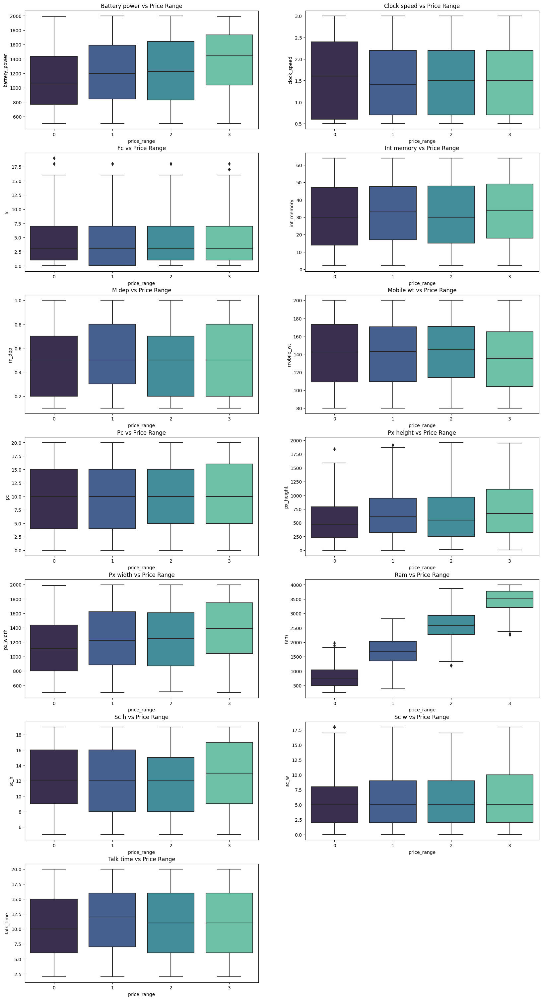

In [238]:
fig=plt.figure(figsize=(20,38))
for i,col in enumerate(numerical_variables):
    ax=fig.add_subplot(7,2,i+1)
    sns.boxplot(y=train_xy[col],x=train_xy['price_range'], palette = "mako")
    plt.title(f'{(" ".join(col.split("_")).capitalize())} vs Price Range')

**observation:** 
* Very high cost devices have higher battery power.
* Very high cost devices have higher memory.
* as the RAM increases the price range increases significantly.
* Compartively thick mobile has lower price and very thin mobile is much expensive
* Low priced devices can be less weighted because they don't have as many features as a expensive devices do such as cameras.
* Primary camera affects the mobile price
* Maximum Talk time found in low to medium price range.

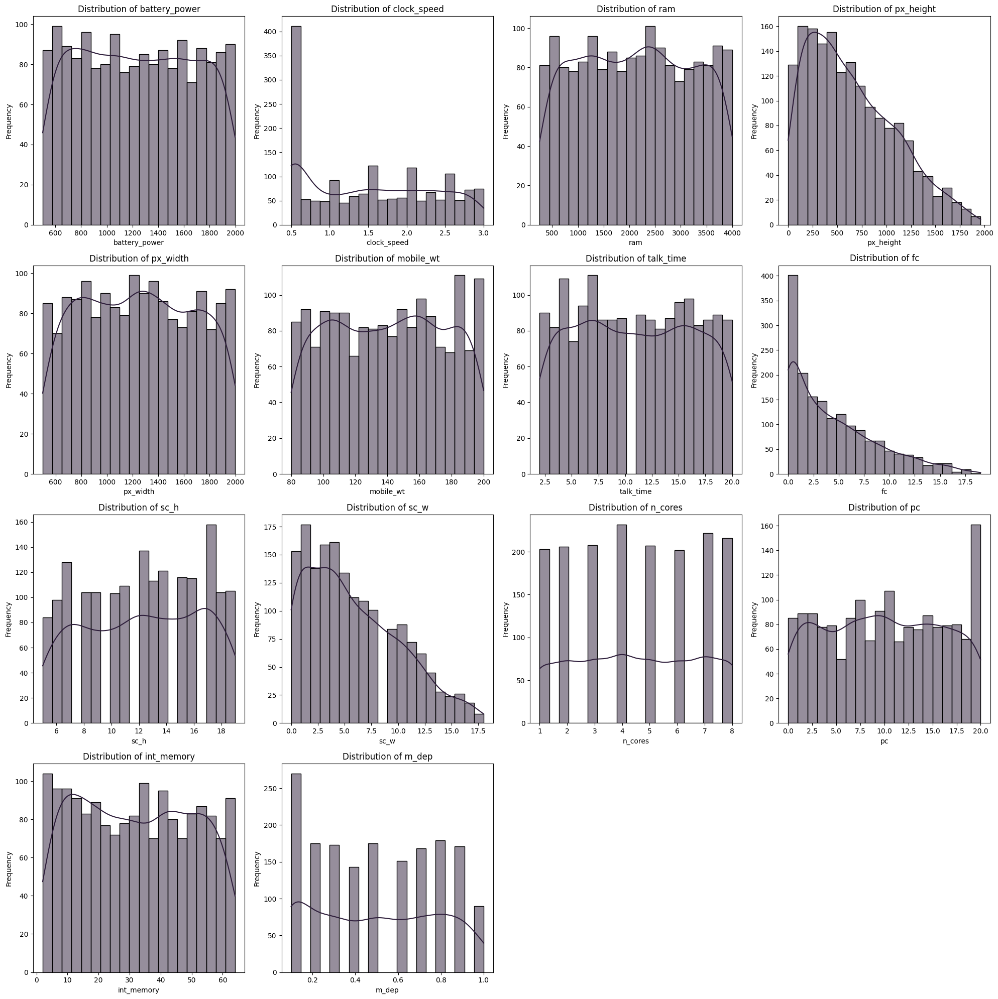

In [253]:
# Checking distributions of numerical data
fig = plt.figure(figsize=(20, 20))

rows = len(numerical_variables) // 4 + 1 

for index, col in enumerate(numerical_variables):
    plt.subplot(rows, 4, index + 1)
    sns.histplot(train_xy[col], kde=True, bins=20, edgecolor='black')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

## 3. Correlation

In [254]:
train_xy.corr().price_range.sort_values()

mobile_wt       -0.037437
touch_screen    -0.035777
clock_speed     -0.006129
n_cores          0.002879
talk_time        0.006201
blue             0.012102
m_dep            0.012407
four_g           0.014011
fc               0.018304
three_g          0.019209
dual_sim         0.021048
sc_h             0.021530
wifi             0.022104
pc               0.035664
int_memory       0.041538
sc_w             0.047400
px_height        0.146499
px_width         0.174109
battery_power    0.200211
ram              0.917033
price_range      1.000000
Name: price_range, dtype: float64

<Axes: >

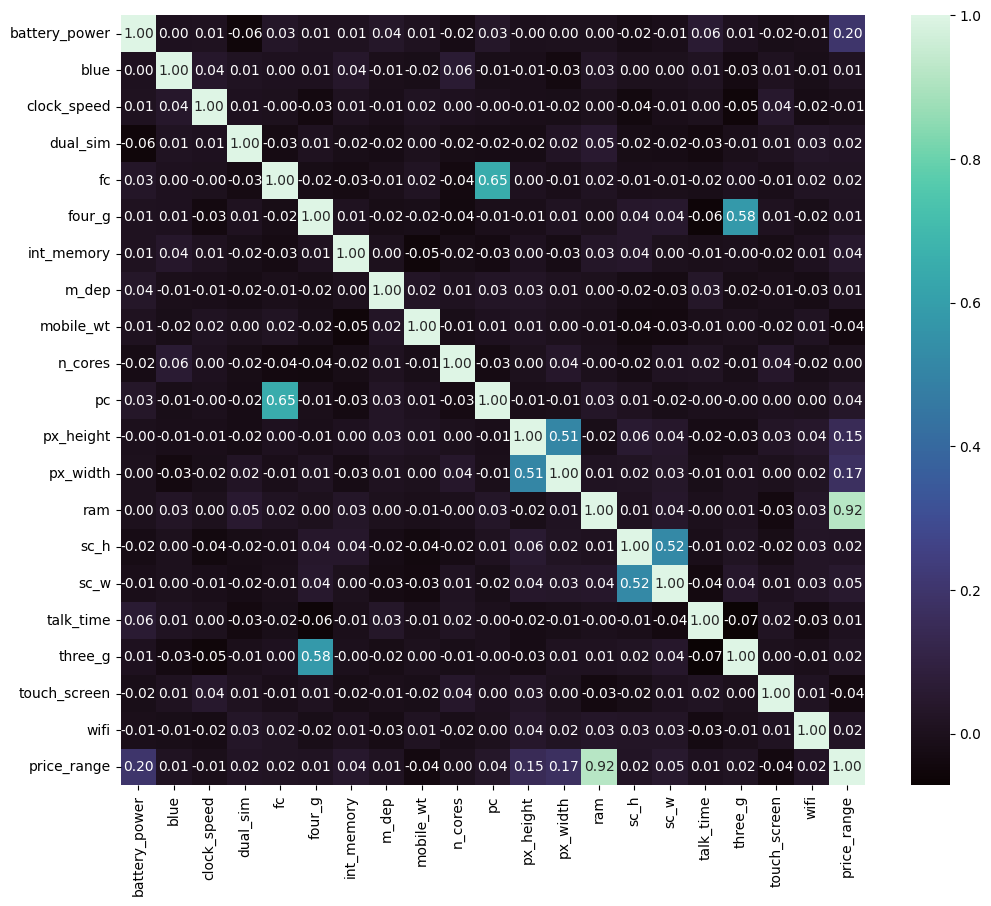

In [262]:
plt.figure(figsize = (12,10))
sns.heatmap(train_xy.corr(), cmap= 'mako',annot = True , fmt='.2f' )

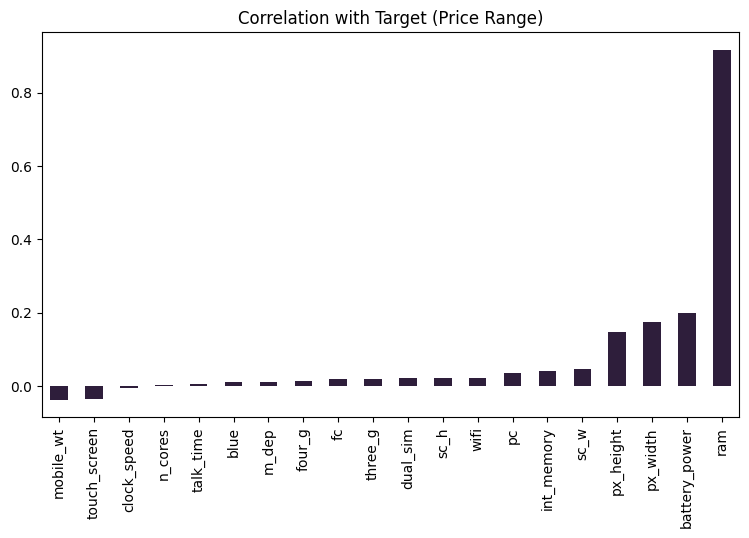

In [265]:
train_xy = pd.concat((X_train,y_train), axis = 1)
plt.figure(figsize=(9,5))
train_xy.corr().price_range.sort_values()[:-1].plot(kind= 'bar')
plt.title('Correlation with Target (Price Range)');

- Highly Correlated Features:

    * RAM: Strongest positive correlation with price range. Devices with more RAM are more expensive.
    * Battery Power: Positive correlation. Devices with larger battery capacities tend to be higher priced.
    * Pixel Resolution: Pixel height and width both positively correlate with price range. Higher resolution screens are linked to higher prices.
    
    
- Moderately Correlated Features:

    * Internal Memory: Slight positive correlation. More internal storage often corresponds to a higher price.
    * Screen Size: Screen width and height have modest positive correlations, indicating larger screens may increase device cost.

# Model Training

In [267]:
print('Shape of X train : {} \nShape of y train : {}'.format(X_train.shape , y_train.shape))
print('Shape of X test : {} \nShape of y test : {}'.format(X_test.shape , y_test.shape))

Shape of X train : (1700, 20) 
Shape of y train : (1700,)
Shape of X test : (300, 20) 
Shape of y test : (300,)


In [9]:
# Preprocessing for categorical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent'))
])

# Combine num & cat preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_variables),
        ('cat', categorical_transformer, categorical_variables)
    ])

## LightGBM
* LightGBM is a gradient boosting framework that uses tree based learning algorithms. It is designed to be distributed and efficient with the following advantages:
 
    * Faster training speed and higher efficiency.
    * Lower memory usage.
    * Better accuracy.
    * Support of parallel and GPU learning.
    * Capable of handling large-scale data.

In [9]:
# Define the model
model = LGBMClassifier(random_state=42)

# Create the pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', model)
])

In [11]:
# Fit the pipleine
pipeline.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1368
[LightGBM] [Info] Number of data points in the train set: 1700, number of used features: 20
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['battery_power',
                                                   'clock_speed', 'fc',
                                                   'int_memory', 'm_dep',
                                                   'mobile_wt', 'pc',
                                                   'px_height', 'px_width',
                                                   'ram', 'sc_h', 'sc_w',
                                                   'talk_time']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['blue', 'dual_sim', 'four_g',
                                                   'n_cores', 'three_g',
                                                   'touch_screen', 'wifi'])])),
                ('classifier', LGBMClassifier(random_state=42))])

In [12]:
y_pred = pipeline.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy : {}% \n'.format(accuracy_score(y_test , y_pred)*100))

Accuracy : 94.33333333333334% 



In [19]:
print('Classification Report : \n\n{}'.format(classification_report(y_test , y_pred)))

Classification Report : 

              precision    recall  f1-score   support

           0       0.96      1.00      0.98        75
           1       0.94      0.91      0.93        75
           2       0.89      0.93      0.91        75
           3       0.99      0.93      0.96        75

    accuracy                           0.94       300
   macro avg       0.94      0.94      0.94       300
weighted avg       0.94      0.94      0.94       300



Text(0.5, 1.0, 'Confusion Matrix')

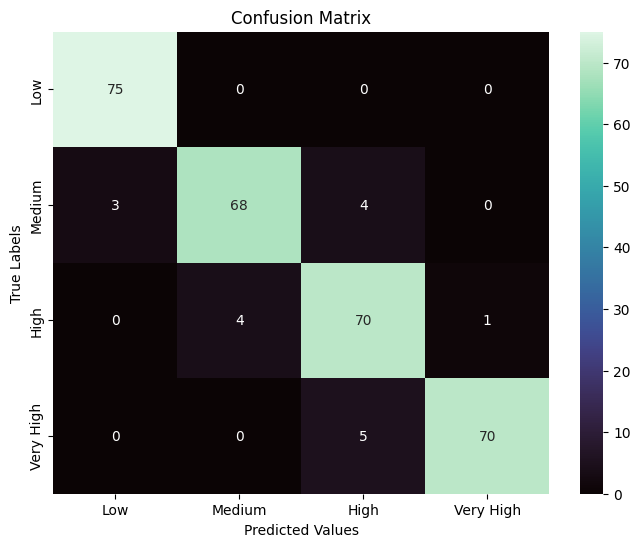

In [35]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
ax = sns.heatmap(cm,fmt='d',annot=True,cmap='mako', xticklabels=list(price_map.values()), yticklabels=list(price_map.values()))
plt.xlabel('Predicted Values')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')

Observations:
* Class 0 (Low Cost) has the highest recall (1.00), meaning the model identifies all instances of this class correctly. However, its precision is slightly lower than Class 3.
* Class 1 (Medium Cost) has a slightly lower recall (0.91) compared to its precision (0.94), indicating that some instances of this class might be misclassified into other classes.
* Class 2 (High Cost) has the lowest precision (0.89) among all classes, suggesting that there are more false positives for this class compared to others.
* Class 3 (Very High Cost) has the highest precision (0.99), indicating that when the model predicts this class, it is almost always correct. However, its recall is slightly lower (0.93), meaning some instances of this class are missed.
* Accuracy: The overall accuracy of the model is 94%. This indicates that the model correctly predicts the price range for 94% of the test samples.
* Macro Average: The macro average precision, recall, and f1-score are all 0.94. This shows that the model performs consistently well across all price ranges, without being biased towards any particular class.
* Weighted Average: The weighted average precision, recall, and f1-score are also 0.94, taking into account the support (number of true instances) of each class. This indicates balanced performance across the different classes.

## Model Fintuning

In [8]:
import optuna

In [10]:
def objective(trial):
    # Define the hyperparameters to be tuned
    n_estimators = trial.suggest_int('classifier__n_estimators', 50, 200, step=50)
    max_depth = trial.suggest_int('classifier__max_depth', 3, 9, step=2)
    learning_rate = trial.suggest_loguniform('classifier__learning_rate', 0.01, 0.3)
    subsample = trial.suggest_uniform('classifier__subsample', 0.6, 1.0)
    colsample_bytree = trial.suggest_uniform('classifier__colsample_bytree', 0.6, 1.0)
    gamma = trial.suggest_uniform('classifier__gamma', 0, 0.3)
    
    # Create the classifier with suggested hyperparameters
    model = LGBMClassifier(
        random_state=42,
        n_estimators=n_estimators,
        max_depth=max_depth,
        learning_rate=learning_rate,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        reg_alpha=gamma
    )
    
    # Create the pipeline (assuming 'preprocessor' is defined elsewhere)
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', model)
    ])
    
    # Perform cross-validation
    score = cross_val_score(pipeline, X_train, y_train, cv=5, n_jobs=-1)
    
    # Return the mean accuracy
    return score.mean()

In [11]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

[I 2024-07-06 22:54:15,574] A new study created in memory with name: no-name-6746fef6-cc07-4e73-af98-338eb2362dd6


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1364
[LightGBM] [Info] Number of data points in the train set: 1360, number of used features: 20
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[I 2024-07-06 22:54:22,771] Trial 0 finished with value: 0.8752941176470589 and parameters: {'classifier__n_estimators': 50, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.053761380942089564, 'classifier__subsample': 0.9917604614480909, 'classifier__colsample_bytree': 0.6674110077519874, 'classifier__gamma': 0.1569227567470227}. Best is trial 0 with value: 0.8752941176470589.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:25,385] Trial 1 finished with value: 0.8876470588235295 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.017426512392121868, 'classifier__subsample': 0.9198422495795557, 'classifier__colsample_bytree': 0.9955868523544679, 'classifier__gamma': 0.26952840855854165}. Best is trial 1 with value: 0.8876470588235295.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:26,363] Trial 2 finished with value: 0.8952941176470588 and parameters: {'classifier__n_estimators': 50, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.07176860008346243, 'classifier__subsample': 0.9633031725605288, 'classifier__colsample_bytree': 0.983529900429433, 'classifier__gamma': 0.04193372267731479}. Best is trial 2 with value: 0.8952941176470588.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:27,090] Trial 3 finished with value: 0.8558823529411764 and parameters: {'classifier__n_estimators': 50, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.03296193980508028, 'classifier__subsample': 0.6223393547028474, 'classifier__colsample_bytree': 0.8461145353967686, 'classifier__gamma': 0.1269339659893063}. Best is trial 2 with value: 0.8952941176470588.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was

[I 2024-07-06 22:54:28,640] Trial 4 finished with value: 0.89 and parameters: {'classifier__n_estimators': 200, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.2736339121820377, 'classifier__subsample': 0.9907765729936547, 'classifier__colsample_bytree': 0.8812505557314239, 'classifier__gamma': 0.22310098491656258}. Best is trial 2 with value: 0.8952941176470588.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:32,023] Trial 5 finished with value: 0.8882352941176471 and parameters: {'classifier__n_estimators': 200, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.013486295032263474, 'classifier__subsample': 0.9700136358265259, 'classifier__colsample_bytree': 0.8273465076247517, 'classifier__gamma': 0.27471379913408955}. Best is trial 2 with value: 0.8952941176470588.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:32,499] Trial 6 finished with value: 0.8758823529411766 and parameters: {'classifier__n_estimators': 50, 'classifier__max_depth': 3, 'classifier__learning_rate': 0.15341663858171117, 'classifier__subsample': 0.7146610394385042, 'classifier__colsample_bytree': 0.7214551721202078, 'classifier__gamma': 0.11044245823252892}. Best is trial 2 with value: 0.8952941176470588.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:34,985] Trial 7 finished with value: 0.8905882352941177 and parameters: {'classifier__n_estimators': 200, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.07911377465219861, 'classifier__subsample': 0.6633509385078344, 'classifier__colsample_bytree': 0.6964631048461789, 'classifier__gamma': 0.16514108270415853}. Best is trial 2 with value: 0.8952941176470588.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:36,783] Trial 8 finished with value: 0.8947058823529412 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.1697738770292349, 'classifier__subsample': 0.6536547374031019, 'classifier__colsample_bytree': 0.8092698848028917, 'classifier__gamma': 0.012028815841527263}. Best is trial 2 with value: 0.8952941176470588.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:38,339] Trial 9 finished with value: 0.8958823529411765 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.06679896411230112, 'classifier__subsample': 0.6373217723723045, 'classifier__colsample_bytree': 0.7694789941201154, 'classifier__gamma': 0.18855520420666363}. Best is trial 9 with value: 0.8958823529411765.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:39,138] Trial 10 finished with value: 0.8270588235294118 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 3, 'classifier__learning_rate': 0.030708981899095152, 'classifier__subsample': 0.7890562573304494, 'classifier__colsample_bytree': 0.6223059166112445, 'classifier__gamma': 0.20803736488732477}. Best is trial 9 with value: 0.8958823529411765.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:40,939] Trial 11 finished with value: 0.8964705882352941 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.0796386931553537, 'classifier__subsample': 0.878090975694463, 'classifier__colsample_bytree': 0.9458151297370189, 'classifier__gamma': 0.044159537153378114}. Best is trial 11 with value: 0.8964705882352941.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:42,852] Trial 12 finished with value: 0.8935294117647059 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.11485621459520627, 'classifier__subsample': 0.8580272103573219, 'classifier__colsample_bytree': 0.9204380175933694, 'classifier__gamma': 0.062451781057805855}. Best is trial 11 with value: 0.8964705882352941.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:45,438] Trial 13 finished with value: 0.89 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.04045805375148815, 'classifier__subsample': 0.7684049745345636, 'classifier__colsample_bytree': 0.7611405506927194, 'classifier__gamma': 0.09182245084858631}. Best is trial 11 with value: 0.8964705882352941.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:47,759] Trial 14 finished with value: 0.8935294117647059 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.08251812050885719, 'classifier__subsample': 0.8687392608688729, 'classifier__colsample_bytree': 0.7615601094499301, 'classifier__gamma': 0.21269383204207334}. Best is trial 11 with value: 0.8964705882352941.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:50,085] Trial 15 finished with value: 0.8852941176470589 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.022506365422292337, 'classifier__subsample': 0.8436001862788849, 'classifier__colsample_bytree': 0.8952515861383524, 'classifier__gamma': 0.0014784447280614052}. Best is trial 11 with value: 0.8964705882352941.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:51,599] Trial 16 finished with value: 0.8988235294117647 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.04911698441892491, 'classifier__subsample': 0.9101894994403273, 'classifier__colsample_bytree': 0.9435362319874763, 'classifier__gamma': 0.18032902953585778}. Best is trial 16 with value: 0.8988235294117647.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:56,178] Trial 17 finished with value: 0.8947058823529412 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.043725595335698426, 'classifier__subsample': 0.9254283298156212, 'classifier__colsample_bytree': 0.9482406261871067, 'classifier__gamma': 0.08139027486372996}. Best is trial 16 with value: 0.8988235294117647.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:54:57,918] Trial 18 finished with value: 0.8964705882352941 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.11313024512058432, 'classifier__subsample': 0.903754035407733, 'classifier__colsample_bytree': 0.9297259226572245, 'classifier__gamma': 0.13171171591092734}. Best is trial 16 with value: 0.8988235294117647.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:04,838] Trial 19 finished with value: 0.8617647058823529 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.010610503001506223, 'classifier__subsample': 0.8342437478117005, 'classifier__colsample_bytree': 0.8649867633800747, 'classifier__gamma': 0.03815674476230521}. Best is trial 16 with value: 0.8988235294117647.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:05,733] Trial 20 finished with value: 0.8694117647058824 and parameters: {'classifier__n_estimators': 50, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.024657780555779003, 'classifier__subsample': 0.7423580407926865, 'classifier__colsample_bytree': 0.9571140897246035, 'classifier__gamma': 0.23723449794499263}. Best is trial 16 with value: 0.8988235294117647.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:07,252] Trial 21 finished with value: 0.8994117647058824 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.11413833363163893, 'classifier__subsample': 0.9064724800407903, 'classifier__colsample_bytree': 0.9159359104759632, 'classifier__gamma': 0.1374717381685421}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:08,996] Trial 22 finished with value: 0.8941176470588236 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.10886598952029088, 'classifier__subsample': 0.8927144890658818, 'classifier__colsample_bytree': 0.9006041323295848, 'classifier__gamma': 0.17817025352286625}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:10,277] Trial 23 finished with value: 0.8947058823529412 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.197904687713963, 'classifier__subsample': 0.8170026953807795, 'classifier__colsample_bytree': 0.9576070847645438, 'classifier__gamma': 0.13992011524110484}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:11,649] Trial 24 finished with value: 0.8970588235294118 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.05559606062215124, 'classifier__subsample': 0.9480498643704046, 'classifier__colsample_bytree': 0.9205538327967505, 'classifier__gamma': 0.24988681952800518}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:13,488] Trial 25 finished with value: 0.8952941176470588 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.05244795076760786, 'classifier__subsample': 0.9423712345940657, 'classifier__colsample_bytree': 0.8491226338072952, 'classifier__gamma': 0.29523637791228524}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:14,325] Trial 26 finished with value: 0.8764705882352942 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 3, 'classifier__learning_rate': 0.043174349829508886, 'classifier__subsample': 0.9462326889207159, 'classifier__colsample_bytree': 0.9056177065521207, 'classifier__gamma': 0.25850119617167566}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:15,127] Trial 27 finished with value: 0.8941176470588236 and parameters: {'classifier__n_estimators': 50, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.10217201585234909, 'classifier__subsample': 0.9044245659209185, 'classifier__colsample_bytree': 0.9685170402958754, 'classifier__gamma': 0.24549194164126867}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:16,492] Trial 28 finished with value: 0.8958823529411765 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.06052035283085944, 'classifier__subsample': 0.9368184925111172, 'classifier__colsample_bytree': 0.924589198950508, 'classifier__gamma': 0.18128072160884337}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:17,895] Trial 29 finished with value: 0.8852941176470589 and parameters: {'classifier__n_estimators': 50, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.053702618968279055, 'classifier__subsample': 0.990450283338709, 'classifier__colsample_bytree': 0.9979016737151778, 'classifier__gamma': 0.15767970675093695}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:19,192] Trial 30 finished with value: 0.8958823529411765 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.2957928610055336, 'classifier__subsample': 0.9614205529611597, 'classifier__colsample_bytree': 0.8724220411255155, 'classifier__gamma': 0.19838727127527472}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2024-07-06 22:55:21,296] Trial 31 finished with value: 0.8976470588235295 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.08999619983960558, 'classifier__subsample': 0.8801072476088286, 'classifier__colsample_bytree': 0.927430624883257, 'classifier__gamma': 0.10196249971315313}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:23,362] Trial 32 finished with value: 0.8970588235294118 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.1482874035902525, 'classifier__subsample': 0.8922534205076897, 'classifier__colsample_bytree': 0.9325487375711865, 'classifier__gamma': 0.11460953677398436}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:25,954] Trial 33 finished with value: 0.8988235294117647 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.1017295496450049, 'classifier__subsample': 0.9177894235233486, 'classifier__colsample_bytree': 0.9853170844859955, 'classifier__gamma': 0.1026609870045829}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:26,935] Trial 34 finished with value: 0.8952941176470588 and parameters: {'classifier__n_estimators': 50, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.09508099106557259, 'classifier__subsample': 0.9177748445863704, 'classifier__colsample_bytree': 0.9782346345281141, 'classifier__gamma': 0.09482494732063895}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:28,652] Trial 35 finished with value: 0.8935294117647059 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.13340644334582, 'classifier__subsample': 0.8191679480999227, 'classifier__colsample_bytree': 0.9897243243448425, 'classifier__gamma': 0.1459962599941273}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:29,502] Trial 36 finished with value: 0.8958823529411765 and parameters: {'classifier__n_estimators': 50, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.08796720759874295, 'classifier__subsample': 0.8595986930985268, 'classifier__colsample_bytree': 0.9727259466987435, 'classifier__gamma': 0.11707046935838511}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:30,910] Trial 37 finished with value: 0.8964705882352941 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.21066814227472844, 'classifier__subsample': 0.9985608425344463, 'classifier__colsample_bytree': 0.9993263675474331, 'classifier__gamma': 0.06998450364966688}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:32,752] Trial 38 finished with value: 0.8935294117647059 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.12444828807512384, 'classifier__subsample': 0.8823023986791952, 'classifier__colsample_bytree': 0.8848519711670989, 'classifier__gamma': 0.16215582877613585}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:33,638] Trial 39 finished with value: 0.8894117647058823 and parameters: {'classifier__n_estimators': 50, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.2023008203269812, 'classifier__subsample': 0.9709565030994364, 'classifier__colsample_bytree': 0.8418603086696999, 'classifier__gamma': 0.09944112055991747}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:35,267] Trial 40 finished with value: 0.8947058823529412 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.07199064700618046, 'classifier__subsample': 0.9141311507015456, 'classifier__colsample_bytree': 0.8057147660637434, 'classifier__gamma': 0.12864481355431345}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:36,701] Trial 41 finished with value: 0.89 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.06212448302087517, 'classifier__subsample': 0.9595381617158754, 'classifier__colsample_bytree': 0.9126841194331081, 'classifier__gamma': 0.29255884893493017}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:38,423] Trial 42 finished with value: 0.8847058823529412 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.030572217187708955, 'classifier__subsample': 0.9393985110656189, 'classifier__colsample_bytree': 0.9441458039022836, 'classifier__gamma': 0.10724562462518528}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:39,652] Trial 43 finished with value: 0.8941176470588236 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.04881126597265668, 'classifier__subsample': 0.9230914230878452, 'classifier__colsample_bytree': 0.9684997568196245, 'classifier__gamma': 0.14298964907576864}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:41,555] Trial 44 finished with value: 0.8888235294117648 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.03538726928513545, 'classifier__subsample': 0.9718901840927783, 'classifier__colsample_bytree': 0.8602556470600614, 'classifier__gamma': 0.22392186366119837}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:42,443] Trial 45 finished with value: 0.8905882352941177 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 3, 'classifier__learning_rate': 0.07622550761354153, 'classifier__subsample': 0.848249858995981, 'classifier__colsample_bytree': 0.8911783486117467, 'classifier__gamma': 0.0787829512167821}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:44,059] Trial 46 finished with value: 0.8823529411764707 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.06411746512177381, 'classifier__subsample': 0.8760305382546357, 'classifier__colsample_bytree': 0.6032547062605159, 'classifier__gamma': 0.056754640990961114}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:45,402] Trial 47 finished with value: 0.8941176470588236 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.17377230791371884, 'classifier__subsample': 0.8972481382198815, 'classifier__colsample_bytree': 0.8290910389454698, 'classifier__gamma': 0.17175699516098444}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:46,853] Trial 48 finished with value: 0.8964705882352941 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.09040442336613982, 'classifier__subsample': 0.7855198733904294, 'classifier__colsample_bytree': 0.9392793513121808, 'classifier__gamma': 0.19736174983066068}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:49,686] Trial 49 finished with value: 0.891764705882353 and parameters: {'classifier__n_estimators': 200, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.13627379131592193, 'classifier__subsample': 0.6943123271413203, 'classifier__colsample_bytree': 0.6694892848198595, 'classifier__gamma': 0.12489653679789667}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:50,510] Trial 50 finished with value: 0.8941176470588236 and parameters: {'classifier__n_estimators': 50, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.2484879990026227, 'classifier__subsample': 0.9805097497167945, 'classifier__colsample_bytree': 0.9160463242058368, 'classifier__gamma': 0.2774286074695481}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:52,515] Trial 51 finished with value: 0.8947058823529412 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.14491054042301443, 'classifier__subsample': 0.8894769963217853, 'classifier__colsample_bytree': 0.9315761043670612, 'classifier__gamma': 0.11372091103136336}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:54,072] Trial 52 finished with value: 0.8976470588235295 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.12059329875131672, 'classifier__subsample': 0.9259570113119987, 'classifier__colsample_bytree': 0.9598523235216561, 'classifier__gamma': 0.08421297716702747}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:56,000] Trial 53 finished with value: 0.8970588235294118 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.10063770905617592, 'classifier__subsample': 0.9538377361683337, 'classifier__colsample_bytree': 0.9562108508391475, 'classifier__gamma': 0.08374045220583935}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:55:58,244] Trial 54 finished with value: 0.8947058823529412 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.17103528797057824, 'classifier__subsample': 0.9304605039841001, 'classifier__colsample_bytree': 0.9722586733762683, 'classifier__gamma': 0.05089955436541589}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:00,220] Trial 55 finished with value: 0.8964705882352941 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.07218854457078647, 'classifier__subsample': 0.9104684641158326, 'classifier__colsample_bytree': 0.7762509920083164, 'classifier__gamma': 0.028280459671668118}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:02,153] Trial 56 finished with value: 0.89 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.12023313512607092, 'classifier__subsample': 0.8736680139399713, 'classifier__colsample_bytree': 0.9850677418012865, 'classifier__gamma': 0.10239607694546878}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:04,180] Trial 57 finished with value: 0.8911764705882353 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.047238222882135, 'classifier__subsample': 0.8618047171429375, 'classifier__colsample_bytree': 0.9509826546226898, 'classifier__gamma': 0.06966591180023815}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:05,806] Trial 58 finished with value: 0.8994117647058824 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.08378444610240247, 'classifier__subsample': 0.9282107237983029, 'classifier__colsample_bytree': 0.903588301528881, 'classifier__gamma': 0.15327356845138926}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:07,594] Trial 59 finished with value: 0.8970588235294118 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.08233716920581038, 'classifier__subsample': 0.8320658359419221, 'classifier__colsample_bytree': 0.9016088835642918, 'classifier__gamma': 0.13454116006254607}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:09,393] Trial 60 finished with value: 0.898235294117647 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.1045385792696693, 'classifier__subsample': 0.9272546431907877, 'classifier__colsample_bytree': 0.9577434718117037, 'classifier__gamma': 0.08557629949968115}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:10,961] Trial 61 finished with value: 0.8970588235294118 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.10800144231167859, 'classifier__subsample': 0.9289014308346154, 'classifier__colsample_bytree': 0.9629890346344301, 'classifier__gamma': 0.15136670646817257}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:12,900] Trial 62 finished with value: 0.8988235294117647 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.09287521264310437, 'classifier__subsample': 0.9055193044876265, 'classifier__colsample_bytree': 0.9401401507928223, 'classifier__gamma': 0.08746798237557424}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:15,025] Trial 63 finished with value: 0.8947058823529412 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.09105671817003766, 'classifier__subsample': 0.9105800692875212, 'classifier__colsample_bytree': 0.939274816578018, 'classifier__gamma': 0.16933809553418583}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:17,669] Trial 64 finished with value: 0.8976470588235295 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.06749103310254247, 'classifier__subsample': 0.90101990865111, 'classifier__colsample_bytree': 0.8770403102762269, 'classifier__gamma': 0.12044545559087537}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:19,230] Trial 65 finished with value: 0.8958823529411765 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.10151370793641774, 'classifier__subsample': 0.8847381638682107, 'classifier__colsample_bytree': 0.72796218245367, 'classifier__gamma': 0.09199595473312806}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:20,982] Trial 66 finished with value: 0.8947058823529412 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.07935531893305063, 'classifier__subsample': 0.9390714585129158, 'classifier__colsample_bytree': 0.9145140589854726, 'classifier__gamma': 0.15466911954278773}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:23,833] Trial 67 finished with value: 0.8976470588235295 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.056697587528813126, 'classifier__subsample': 0.8468543175730427, 'classifier__colsample_bytree': 0.9853277008599056, 'classifier__gamma': 0.18528714733482493}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:25,479] Trial 68 finished with value: 0.8923529411764706 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.15617003264279197, 'classifier__subsample': 0.9519248378370901, 'classifier__colsample_bytree': 0.9261250454715179, 'classifier__gamma': 0.13682225314039811}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:26,372] Trial 69 finished with value: 0.8835294117647059 and parameters: {'classifier__n_estimators': 50, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.03883283668531139, 'classifier__subsample': 0.9170131795349553, 'classifier__colsample_bytree': 0.9047522520022306, 'classifier__gamma': 0.10688107403043212}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:28,924] Trial 70 finished with value: 0.8964705882352941 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.1112993258812625, 'classifier__subsample': 0.8685743837029088, 'classifier__colsample_bytree': 0.9446696570171433, 'classifier__gamma': 0.07630801866908393}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:30,896] Trial 71 finished with value: 0.8964705882352941 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.08514299069433633, 'classifier__subsample': 0.9267376190362544, 'classifier__colsample_bytree': 0.9529200511291729, 'classifier__gamma': 0.0858897914328648}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:32,870] Trial 72 finished with value: 0.8970588235294118 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.1272099541899941, 'classifier__subsample': 0.903339511161691, 'classifier__colsample_bytree': 0.979105800462975, 'classifier__gamma': 0.06214259200334331}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:35,272] Trial 73 finished with value: 0.8929411764705882 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.11590788276460497, 'classifier__subsample': 0.934637006613812, 'classifier__colsample_bytree': 0.9332930191277499, 'classifier__gamma': 0.09555836555075127}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:36,777] Trial 74 finished with value: 0.8941176470588236 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.09670203622346997, 'classifier__subsample': 0.89214229129984, 'classifier__colsample_bytree': 0.8944566426917324, 'classifier__gamma': 0.06924739474283333}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:38,458] Trial 75 finished with value: 0.8941176470588236 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.13956090100182872, 'classifier__subsample': 0.9846080821994898, 'classifier__colsample_bytree': 0.9677137130684745, 'classifier__gamma': 0.08912560908412993}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:40,262] Trial 76 finished with value: 0.8958823529411765 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.06961309665773449, 'classifier__subsample': 0.9458250910037426, 'classifier__colsample_bytree': 0.9895643591569426, 'classifier__gamma': 0.03359386860681596}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:41,641] Trial 77 finished with value: 0.8941176470588236 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.16031276943179887, 'classifier__subsample': 0.9201346318773588, 'classifier__colsample_bytree': 0.9566592019565185, 'classifier__gamma': 0.12379029091374089}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:43,348] Trial 78 finished with value: 0.891764705882353 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.12504156873867492, 'classifier__subsample': 0.9694728140156588, 'classifier__colsample_bytree': 0.9194829072541094, 'classifier__gamma': 0.10349383475656526}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:44,903] Trial 79 finished with value: 0.8911764705882353 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.10078659523927964, 'classifier__subsample': 0.9099520845398715, 'classifier__colsample_bytree': 0.9088654024953179, 'classifier__gamma': 0.19513470170224162}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:46,093] Trial 80 finished with value: 0.8935294117647059 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.18410094346155192, 'classifier__subsample': 0.8793553832463986, 'classifier__colsample_bytree': 0.9402812914357032, 'classifier__gamma': 0.1764005110259005}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:47,732] Trial 81 finished with value: 0.8976470588235295 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.06898104419750674, 'classifier__subsample': 0.6032607597500301, 'classifier__colsample_bytree': 0.8883900056158642, 'classifier__gamma': 0.12484251021014146}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:49,565] Trial 82 finished with value: 0.8947058823529412 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.08780378467872849, 'classifier__subsample': 0.9009447310512119, 'classifier__colsample_bytree': 0.8742387946487746, 'classifier__gamma': 0.11538564238697233}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:51,200] Trial 83 finished with value: 0.8923529411764706 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.07668213896158467, 'classifier__subsample': 0.9004798155617272, 'classifier__colsample_bytree': 0.8749740323481053, 'classifier__gamma': 0.15993258252636022}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:52,997] Trial 84 finished with value: 0.8958823529411765 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.05818877621743529, 'classifier__subsample': 0.9228584255945117, 'classifier__colsample_bytree': 0.9266753434563562, 'classifier__gamma': 0.1466758272265522}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:54,879] Trial 85 finished with value: 0.8941176470588236 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.0642972990264032, 'classifier__subsample': 0.953294669003375, 'classifier__colsample_bytree': 0.9616981620436017, 'classifier__gamma': 0.11964004662156265}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:56,752] Trial 86 finished with value: 0.8964705882352941 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.11008468752393731, 'classifier__subsample': 0.8872598750168407, 'classifier__colsample_bytree': 0.9766220122650143, 'classifier__gamma': 0.07681555975464444}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:56:58,581] Trial 87 finished with value: 0.8929411764705882 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.09603855479493241, 'classifier__subsample': 0.8657336009273631, 'classifier__colsample_bytree': 0.8587299050134597, 'classifier__gamma': 0.10955635783290905}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:57:00,961] Trial 88 finished with value: 0.8941176470588236 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.0831065303954011, 'classifier__subsample': 0.9081772860653854, 'classifier__colsample_bytree': 0.9474958643648743, 'classifier__gamma': 0.09831596649251971}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:57:04,935] Trial 89 finished with value: 0.891764705882353 and parameters: {'classifier__n_estimators': 200, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.05185138213380325, 'classifier__subsample': 0.9383609605128589, 'classifier__colsample_bytree': 0.7921458337189718, 'classifier__gamma': 0.21008425089516916}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:57:07,496] Trial 90 finished with value: 0.8864705882352941 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.016302614795556176, 'classifier__subsample': 0.765256608201182, 'classifier__colsample_bytree': 0.9993023110255792, 'classifier__gamma': 0.13180427954416707}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:57:11,110] Trial 91 finished with value: 0.8952941176470588 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.060385549329315336, 'classifier__subsample': 0.8520050897073455, 'classifier__colsample_bytree': 0.984881112920746, 'classifier__gamma': 0.19056258224290196}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:57:14,432] Trial 92 finished with value: 0.8976470588235295 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.07502981416559272, 'classifier__subsample': 0.8396714299330823, 'classifier__colsample_bytree': 0.9632406644651478, 'classifier__gamma': 0.1834288304397143}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:57:17,085] Trial 93 finished with value: 0.8970588235294118 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.04711163554973968, 'classifier__subsample': 0.892455137870416, 'classifier__colsample_bytree': 0.9370192596407446, 'classifier__gamma': 0.2208930318453429}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:57:18,873] Trial 94 finished with value: 0.8988235294117647 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.05415700503171035, 'classifier__subsample': 0.8098823356709698, 'classifier__colsample_bytree': 0.9903179005856654, 'classifier__gamma': 0.1677353270096947}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:57:20,686] Trial 95 finished with value: 0.8923529411764706 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.06589593113882904, 'classifier__subsample': 0.7061162670903264, 'classifier__colsample_bytree': 0.9736935731493617, 'classifier__gamma': 0.1420168816636806}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:57:22,506] Trial 96 finished with value: 0.8947058823529412 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.09104858781489328, 'classifier__subsample': 0.8023492913716946, 'classifier__colsample_bytree': 0.9922132096939391, 'classifier__gamma': 0.16800035138196634}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:57:24,170] Trial 97 finished with value: 0.8929411764705882 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.10653058094015948, 'classifier__subsample': 0.9308315671449047, 'classifier__colsample_bytree': 0.9233324796720646, 'classifier__gamma': 0.08804340219433254}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:57:25,970] Trial 98 finished with value: 0.8935294117647059 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.12091043501452269, 'classifier__subsample': 0.9183524275033264, 'classifier__colsample_bytree': 0.9472919923347911, 'classifier__gamma': 0.15368604034091424}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-07-06 22:57:27,716] Trial 99 finished with value: 0.8941176470588236 and parameters: {'classifier__n_estimators': 100, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.04317758187132399, 'classifier__subsample': 0.8976766305089763, 'classifier__colsample_bytree': 0.9102615430143925, 'classifier__gamma': 0.047337861432511154}. Best is trial 21 with value: 0.8994117647058824.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [14]:
best_params = study.best_params
print("Best parameters found: ", best_params)

# Train the final model with the best parameters
best_model = LGBMClassifier(
    random_state=42,
    n_estimators=best_params['classifier__n_estimators'],
    max_depth=best_params['classifier__max_depth'],
    learning_rate=best_params['classifier__learning_rate'],
    subsample=best_params['classifier__subsample'],
    colsample_bytree=best_params['classifier__colsample_bytree'],
    reg_alpha=best_params['classifier__gamma']
)

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', best_model)
])

pipeline.fit(X_train, y_train)


Best parameters found:  {'classifier__n_estimators': 100, 'classifier__max_depth': 7, 'classifier__learning_rate': 0.11413833363163893, 'classifier__subsample': 0.9064724800407903, 'classifier__colsample_bytree': 0.9159359104759632, 'classifier__gamma': 0.1374717381685421}
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1368
[LightGBM] [Info] Number of data points in the train set: 1700, number of used features: 20
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['battery_power',
                                                   'clock_speed', 'fc',
                                                   'int_memory', 'm_dep',
                                                   'mobile_wt', 'pc',
                                                   'px_height', 'px_width',
                                                   'ram', 'sc_h', 'sc_w',
                                                   'talk_time']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['blue', 'dual_sim', 'four_g',
                                                   'n_cores', 'three_g',
                                                   'touch_screen', 'wifi'])])),
                ('classifier',
                 LGBMClassifier(colsample_bytree=0.9159359104759632,
                                learning_rate=0.11413833363163893, max_depth=7,
                                random_state=42, reg_alpha=0.1374717381685421,
                                subsample=0.9064724800407903))])

In [16]:
y_pred = pipeline.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy : {}% \n'.format(accuracy_score(y_test , y_pred)*100))

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Accuracy : 96.0% 



In [17]:
print('Classification Report : \n\n{}'.format(classification_report(y_test , y_pred)))

Classification Report : 

              precision    recall  f1-score   support

           0       0.97      0.99      0.98        75
           1       0.95      0.95      0.95        75
           2       0.93      0.95      0.94        75
           3       0.99      0.96      0.97        75

    accuracy                           0.96       300
   macro avg       0.96      0.96      0.96       300
weighted avg       0.96      0.96      0.96       300



Text(0.5, 1.0, 'Confusion Matrix')

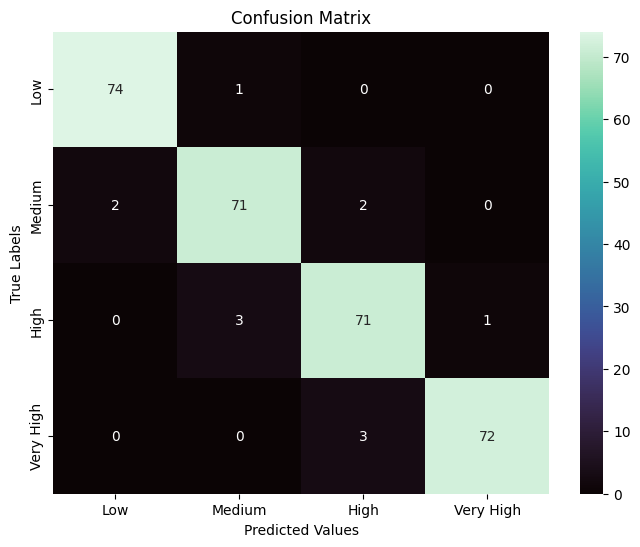

In [20]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
ax = sns.heatmap(cm,fmt='d',annot=True,cmap='mako', xticklabels=list(price_map.values()), yticklabels=list(price_map.values()))
plt.xlabel('Predicted Values')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')

Observations:
* Class 0 (Low Cost)has a high recall of 0.99, indicating that the model correctly identifies almost all instances of this class. The precision is also high at 0.97, meaning that most instances predicted as Class 0 are correctly identified. This balance between precision and recall leads to a very high F1-score of 0.98, showcasing the model's excellent performance in identifying this class.
* Class 1(Medium Cost) demonstrates balanced precision and recall both at 0.95, leading to an F1-score of 0.95. This indicates that the model is equally good at identifying true positives and avoiding false positives for this class.
* Class 2 (High Cost)has a slightly lower precision (0.93) compared to recall (0.95). This suggests that there are slightly more false positives for this class compared to others. However, the high recall indicates that the model is effective at identifying most instances of Class 2, resulting in a solid F1-score of 0.94.
* Class 3 (Very High Cost)has the highest precision (0.99), indicating that when the model predicts this class, it is almost always correct. The recall is slightly lower at 0.96, meaning a small number of instances of this class are missed. Nonetheless, the high precision and recall lead to a strong F1-score of 0.97.
* he macro average precision, recall, and F1-score are all 0.96, showing that the model performs consistently well across all classes, without being biased towards any particular class.
* The weighted average precision, recall, and F1-score are also 0.96, taking into account the support (number of true instances) of each class. This indicates balanced performance across the different classes, ensuring that the model maintains high performance even for classes with different numbers of instances.

`Before vs. After Fine Tuning`
* The model showed improvements after finetuning in terms of accuracy, precision, recall, and F1-score across all classes. 
* The enhancements are particularly notable in Class 1 and Class 2, where the model has reduced misclassifications and false positives. 
* The overall accuracy improved by 2%, indicating better general performance of the model after fine-tuning.

In [24]:
import joblib
joblib.dump(pipeline, '/kaggle/working/lgbm_ft_model.pkl')

['/kaggle/working/lgbm_ft_model.pkl']

In [33]:
predictions = pipeline.predict(test)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


In [34]:
test_preds = pd.DataFrame({'predictions':test_predictions})['predictions'].map(price_map)
test_preds

0      Very High
1      Very High
2           High
3      Very High
4         Medium
         ...    
995         High
996       Medium
997          Low
998         High
999         High
Name: predictions, Length: 1000, dtype: object